In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize']=(10,8)
plt.rcParams['figure.dpi']=700
%matplotlib inline
!pip install xgboost
from xgboost import XGBClassifier

In [2]:
df=pd.read_csv('/content/Titanic_train.csv')

In [3]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [52]:
df2=pd.read_csv('/content/Titanic_test.csv')
df2

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [4]:
# EDA

In [5]:
df.describe(include=object)

,Name,Sex,Ticket,Cabin,Embarked
count,891,891,891,204,889
unique,891,2,681,147,3
top,"Braund, Mr. Owen Harris",male,347082,B96 B98,S
freq,1,577,7,4,644


In [53]:
df2.describe(include=object)

,Name,Sex,Ticket,Cabin,Embarked
count,418,418,418,91,418
unique,418,2,363,76,3
top,"Kelly, Mr. James",male,PC 17608,B57 B59 B63 B66,S
freq,1,266,5,3,270


In [6]:
df.drop(columns=['PassengerId','Name','Ticket','Cabin'],inplace=True)

In [54]:
df2.drop(columns = ['PassengerId','Name','Age','Ticket','Cabin'], inplace = True)

In [7]:
df

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S
3,1,1,female,35.0,1,0,53.1000,S
4,0,3,male,35.0,0,0,8.0500,S
...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S
887,1,1,female,19.0,0,0,30.0000,S
888,0,3,female,NaN,1,2,23.4500,S
889,1,1,male,26.0,0,0,30.0000,C


In [55]:
df2

,Pclass,Sex,SibSp,Parch,Fare,Embarked
0,3,male,0,0,7.8292,Q
1,3,female,1,0,7.0000,S
2,2,male,0,0,9.6875,Q
3,3,male,0,0,8.6625,S
4,3,female,1,1,12.2875,S
...,...,...,...,...,...,...
413,3,male,0,0,8.0500,S
414,1,female,0,0,108.9000,C
415,3,male,0,0,7.2500,S
416,3,male,0,0,8.0500,S


In [8]:
names=df.columns
names

Index(['Survived', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare',
       'Embarked'],
      dtype='object')

In [61]:
names2=df2.columns
names2

Index(['Pclass', 'Sex', 'SibSp', 'Parch', 'Fare', 'Embarked'], dtype='object')

In [9]:
oe=OrdinalEncoder()
data=oe.fit_transform(df)

In [58]:
oe=OrdinalEncoder()
data2=oe.fit_transform(df2)

In [10]:
data

array([[  0.,   2.,   1., ...,   0.,  18.,   2.],
       [  1.,   0.,   0., ...,   0., 207.,   0.],
       [  1.,   2.,   0., ...,   0.,  41.,   2.],
       ...,
       [  0.,   2.,   0., ...,   2., 131.,   2.],
       [  1.,   0.,   1., ...,   0., 153.,   0.],
       [  0.,   2.,   1., ...,   0.,  30.,   1.]])

In [59]:
data2

array([[ 2.,  1.,  0.,  0., 24.,  1.],
       [ 2.,  0.,  1.,  0.,  5.,  2.],
       [ 1.,  1.,  0.,  0., 41.,  1.],
       ...,
       [ 2.,  1.,  0.,  0.,  9.,  2.],
       [ 2.,  1.,  0.,  0., 31.,  2.],
       [ 2.,  1.,  1.,  1., 84.,  0.]])

In [11]:
df=pd.DataFrame(data,columns=names)
df

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0.0,2.0,1.0,28.0,1.0,0.0,18.0,2.0
1,1.0,0.0,0.0,51.0,1.0,0.0,207.0,0.0
2,1.0,2.0,0.0,34.0,0.0,0.0,41.0,2.0
3,1.0,0.0,0.0,47.0,1.0,0.0,189.0,2.0
4,0.0,2.0,1.0,47.0,0.0,0.0,43.0,2.0
...,...,...,...,...,...,...,...,...
886,0.0,1.0,1.0,35.0,0.0,0.0,85.0,2.0
887,1.0,0.0,0.0,24.0,0.0,0.0,153.0,2.0
888,0.0,2.0,0.0,NaN,1.0,2.0,131.0,2.0
889,1.0,0.0,1.0,34.0,0.0,0.0,153.0,0.0


In [62]:
df2=pd.DataFrame(data2,columns=names2)
df2

,Pclass,Sex,SibSp,Parch,Fare,Embarked
0,2.0,1.0,0.0,0.0,24.0,1.0
1,2.0,0.0,1.0,0.0,5.0,2.0
2,1.0,1.0,0.0,0.0,41.0,1.0
3,2.0,1.0,0.0,0.0,34.0,2.0
4,2.0,0.0,1.0,1.0,46.0,2.0
...,...,...,...,...,...,...
413,2.0,1.0,0.0,0.0,31.0,2.0
414,0.0,0.0,0.0,0.0,154.0,0.0
415,2.0,1.0,0.0,0.0,9.0,2.0
416,2.0,1.0,0.0,0.0,31.0,2.0


In [12]:
df.describe()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000,889.000000
mean,0.383838,1.308642,0.647587,38.844538,0.507295,0.381594,105.355780,1.535433
std,0.486592,0.836071,0.477990,18.262145,1.005995,0.806057,70.082521,0.792088
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,25.250000,0.000000,0.000000,40.500000,1.000000
50%,0.000000,2.000000,1.000000,36.000000,0.000000,0.000000,94.000000,2.000000
75%,1.000000,2.000000,1.000000,51.000000,1.000000,0.000000,157.000000,2.000000
max,1.000000,2.000000,1.000000,87.000000,6.000000,6.000000,247.000000,2.000000


In [63]:
df2.describe()

,Pclass,Sex,SibSp,Parch,Fare,Embarked
count,418.000000,418.000000,418.000000,418.000000,417.000000,418.000000
mean,1.265550,0.636364,0.437799,0.382775,70.136691,1.401914
std,0.841838,0.481622,0.823636,0.903969,48.790496,0.854496
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,29.000000,1.000000
50%,2.000000,1.000000,0.000000,0.000000,59.000000,2.000000
75%,2.000000,1.000000,1.000000,0.000000,106.000000,2.000000
max,2.000000,1.000000,6.000000,7.000000,168.000000,2.000000


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    float64
 1   Pclass    891 non-null    float64
 2   Sex       891 non-null    float64
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    float64
 5   Parch     891 non-null    float64
 6   Fare      891 non-null    float64
 7   Embarked  889 non-null    float64
dtypes: float64(8)
memory usage: 55.8 KB


In [64]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Pclass    418 non-null    float64
 1   Sex       418 non-null    float64
 2   SibSp     418 non-null    float64
 3   Parch     418 non-null    float64
 4   Fare      417 non-null    float64
 5   Embarked  418 non-null    float64
dtypes: float64(6)
memory usage: 19.7 KB


In [14]:
df.shape

(891, 8)

In [65]:
df2.shape

(418, 6)

In [15]:
df.isna().sum()

Survived      0
Pclass        0
Sex           0
Age         177
SibSp         0
Parch         0
Fare          0
Embarked      2
dtype: int64

In [66]:
df2.isna().sum()

Pclass      0
Sex         0
SibSp       0
Parch       0
Fare        1
Embarked    0
dtype: int64

In [16]:
df=df.dropna()

In [67]:
df2=df2.dropna()

In [17]:
df.shape

(712, 8)

In [68]:
df2.shape

(417, 6)

In [18]:
df.isna().sum()

Survived    0
Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64

In [69]:
df2.isna().sum()

Pclass      0
Sex         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64

In [19]:
df.duplicated().sum()

38

In [70]:
df2.duplicated().sum()

151

In [20]:
df.drop_duplicates(inplace=True)

In [71]:
df2.drop_duplicates(inplace=True)


In [21]:
# Visualization

<Axes: >

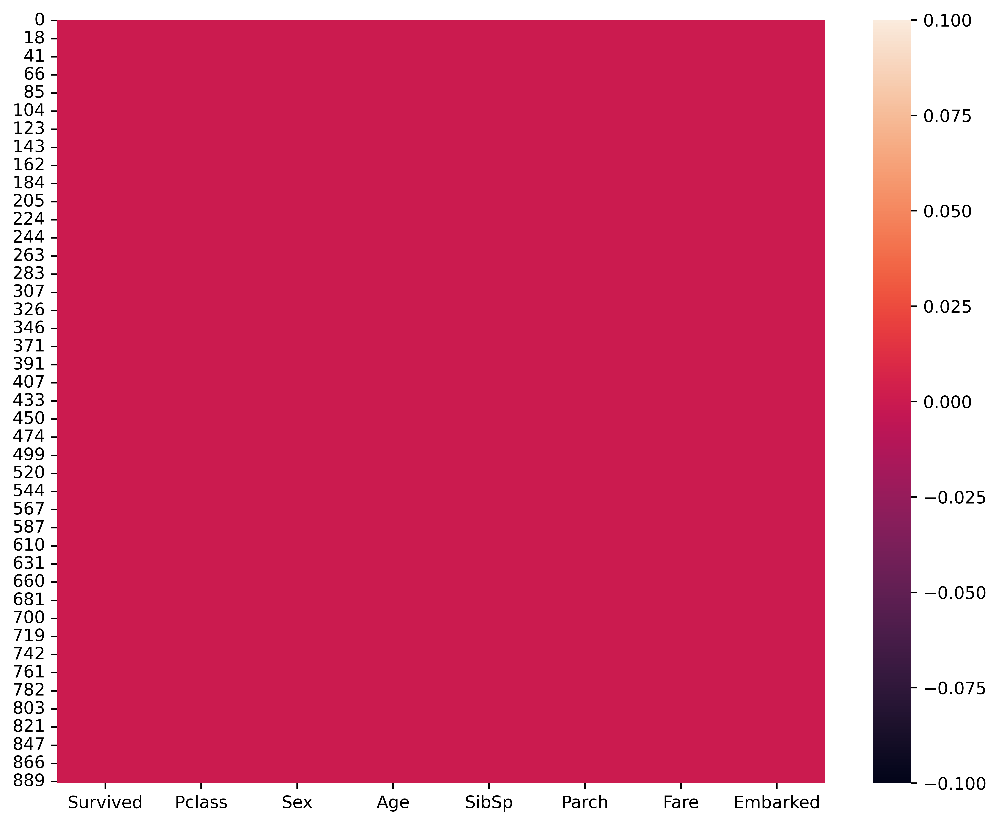

In [22]:
sns.heatmap(df.isna())

<Axes: >

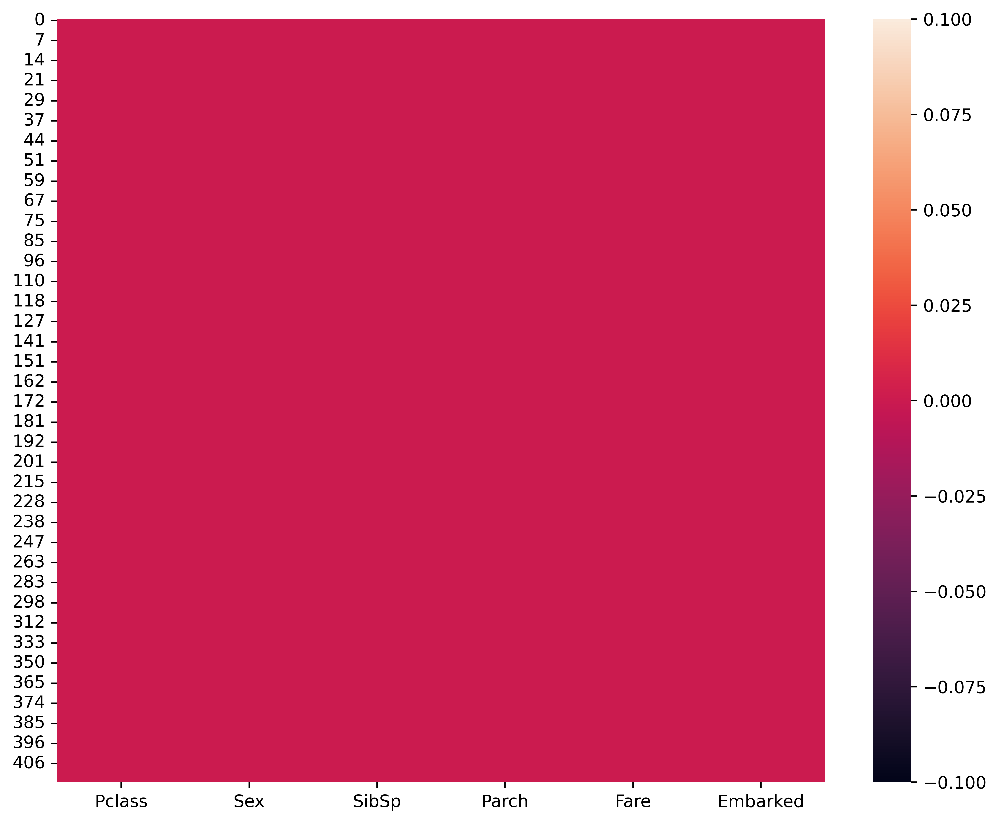

In [72]:
sns.heatmap(df2.isna())

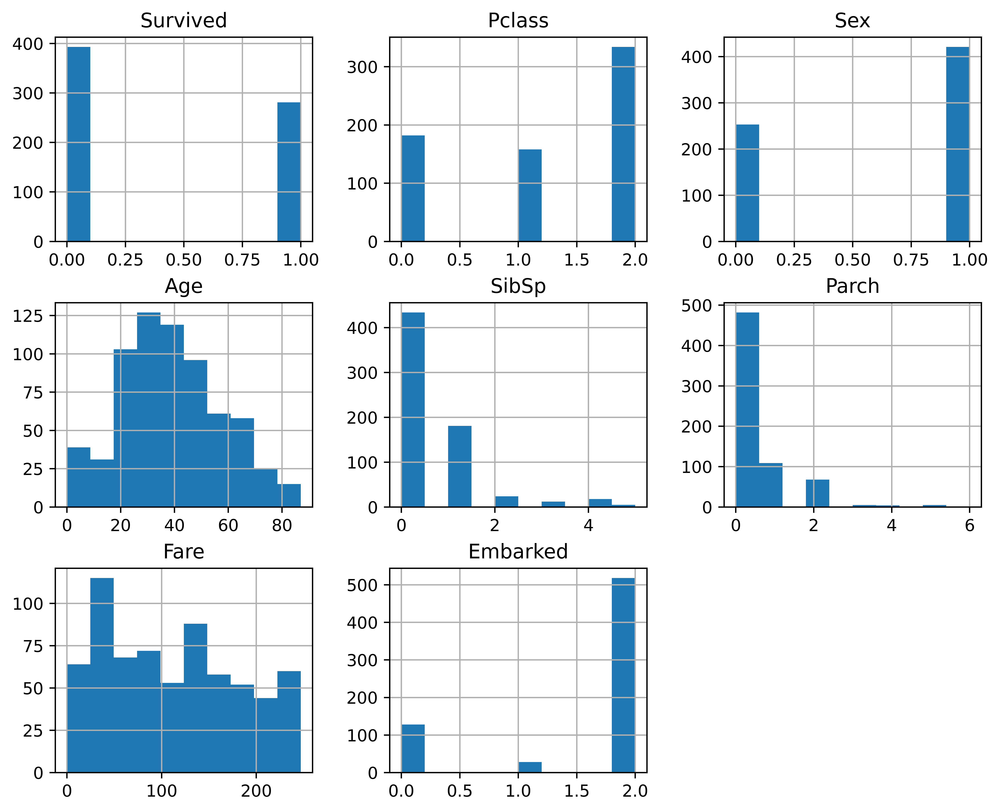

In [23]:
df.hist()
plt.show()

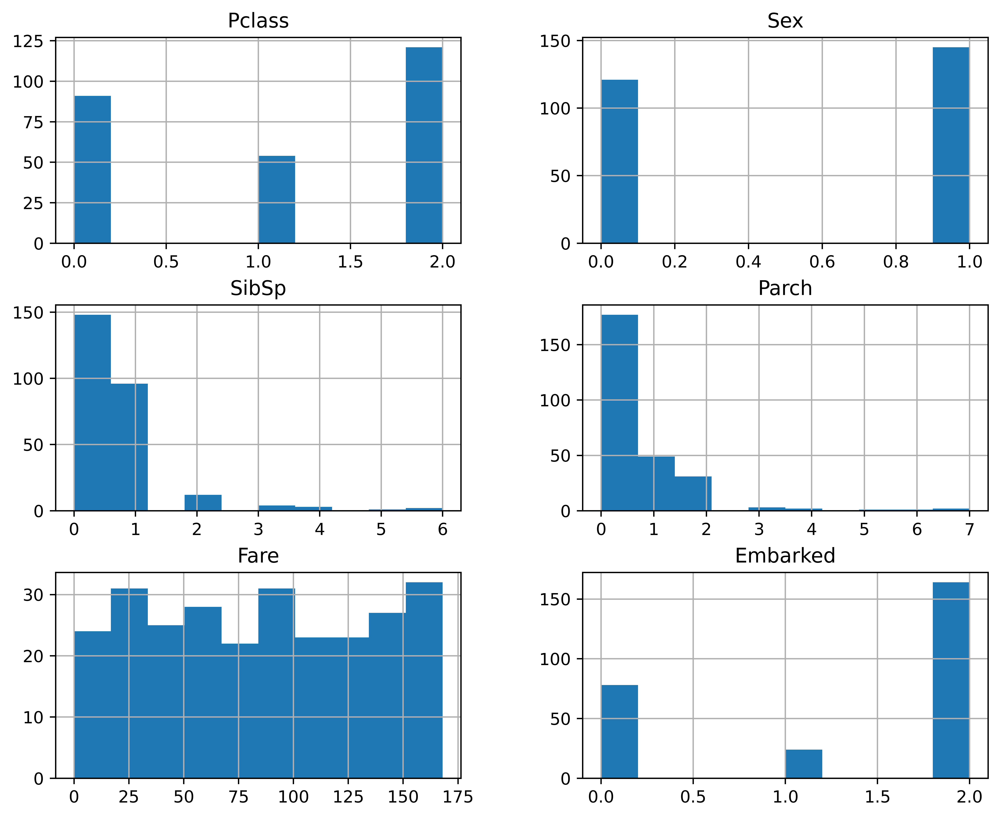

In [73]:
df2.hist()
plt.show()

<Axes: >

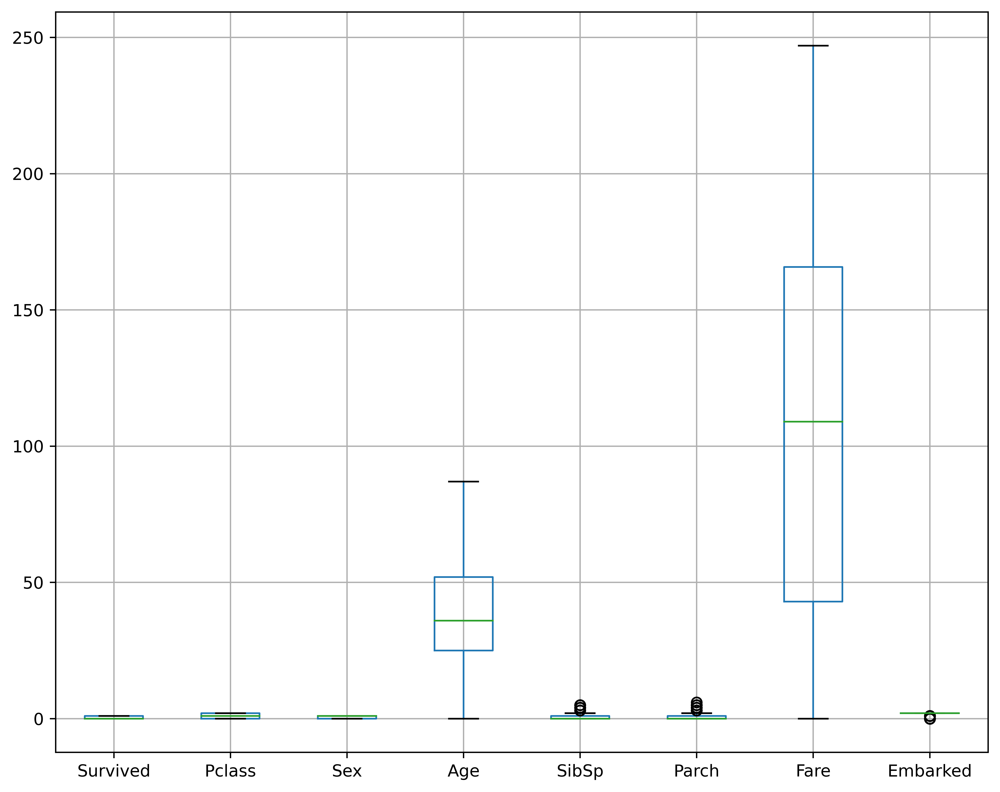

In [24]:
df.boxplot()

<Axes: >

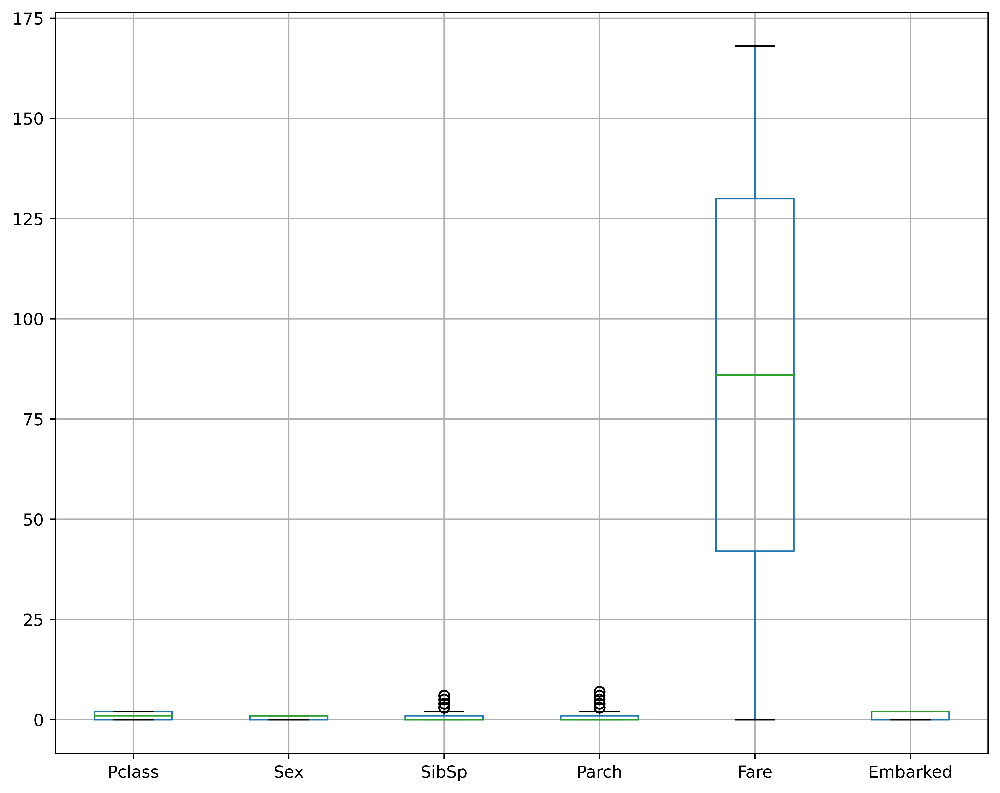

In [74]:
df2.boxplot()

In [25]:
sns.pairplot(df,hue='Survived')

In [26]:
df.corr()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
Survived,1.000000,-0.353706,-0.519043,-0.085247,-0.034734,0.082956,0.326720,-0.166125
Pclass,-0.353706,1.000000,0.137930,-0.367200,0.074853,0.031771,-0.753641,0.240116
Sex,-0.519043,0.137930,1.000000,0.102081,-0.091036,-0.241931,-0.258122,0.090771
Age,-0.085247,-0.367200,0.102081,1.000000,-0.303591,-0.180672,0.124584,-0.035639
SibSp,-0.034734,0.074853,-0.091036,-0.303591,1.000000,0.374674,0.334131,0.050694
Parch,0.082956,0.031771,-0.241931,-0.180672,0.374674,1.000000,0.345592,0.026663
Fare,0.326720,-0.753641,-0.258122,0.124584,0.334131,0.345592,1.000000,-0.236454
Embarked,-0.166125,0.240116,0.090771,-0.035639,0.050694,0.026663,-0.236454,1.000000


In [75]:
df2.corr()

,Pclass,Sex,SibSp,Parch,Fare,Embarked
Pclass,1.000000,0.048137,0.086480,0.094443,-0.765230,0.289992
Sex,0.048137,1.000000,-0.047042,-0.116024,-0.120545,-0.007401
SibSp,0.086480,-0.047042,1.000000,0.264282,0.240329,0.108471
Parch,0.094443,-0.116024,0.264282,1.000000,0.271184,0.112005
Fare,-0.765230,-0.120545,0.240329,0.271184,1.000000,-0.185776
Embarked,0.289992,-0.007401,0.108471,0.112005,-0.185776,1.000000


<Axes: >

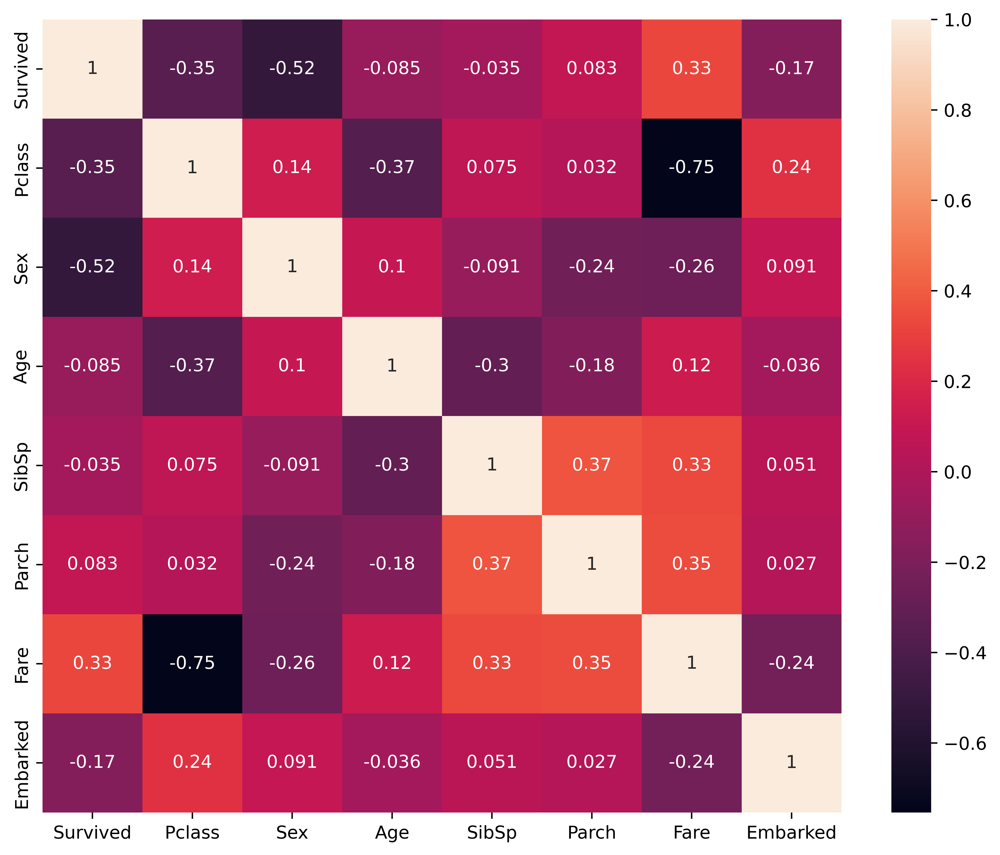

In [27]:
sns.heatmap(df.corr(),annot=True)

<Axes: >

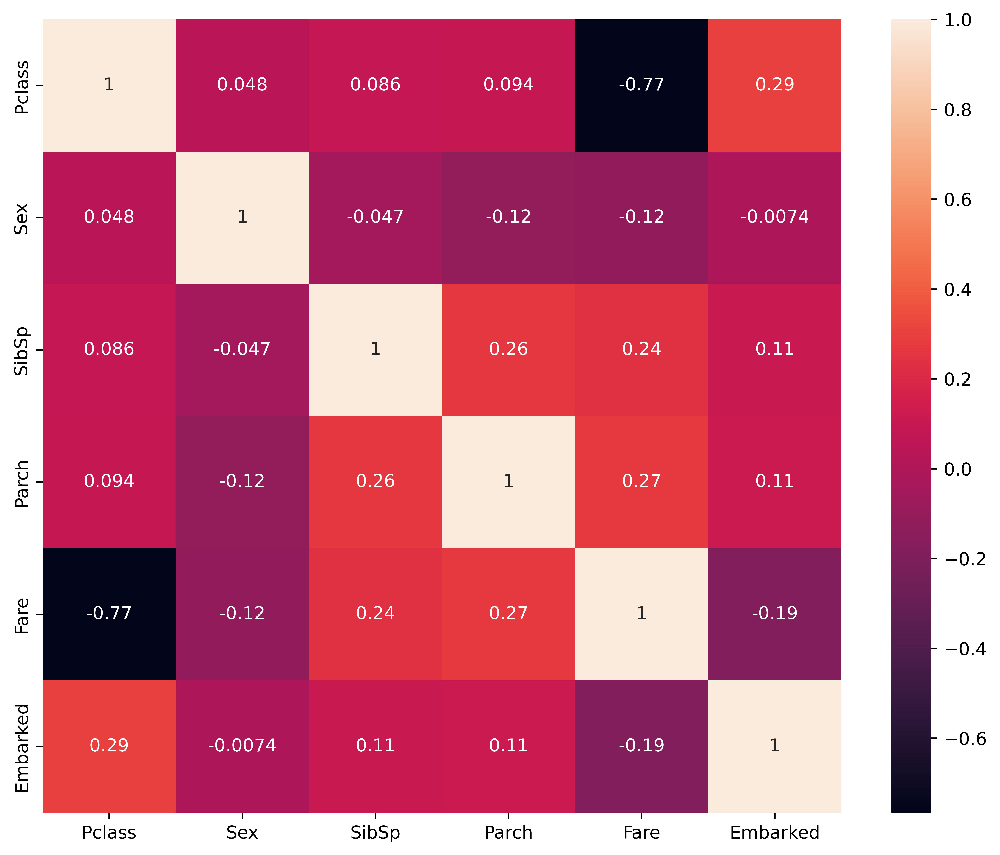

In [76]:
sns.heatmap(df2.corr(),annot=True)

<Axes: xlabel='Survived', ylabel='count'>

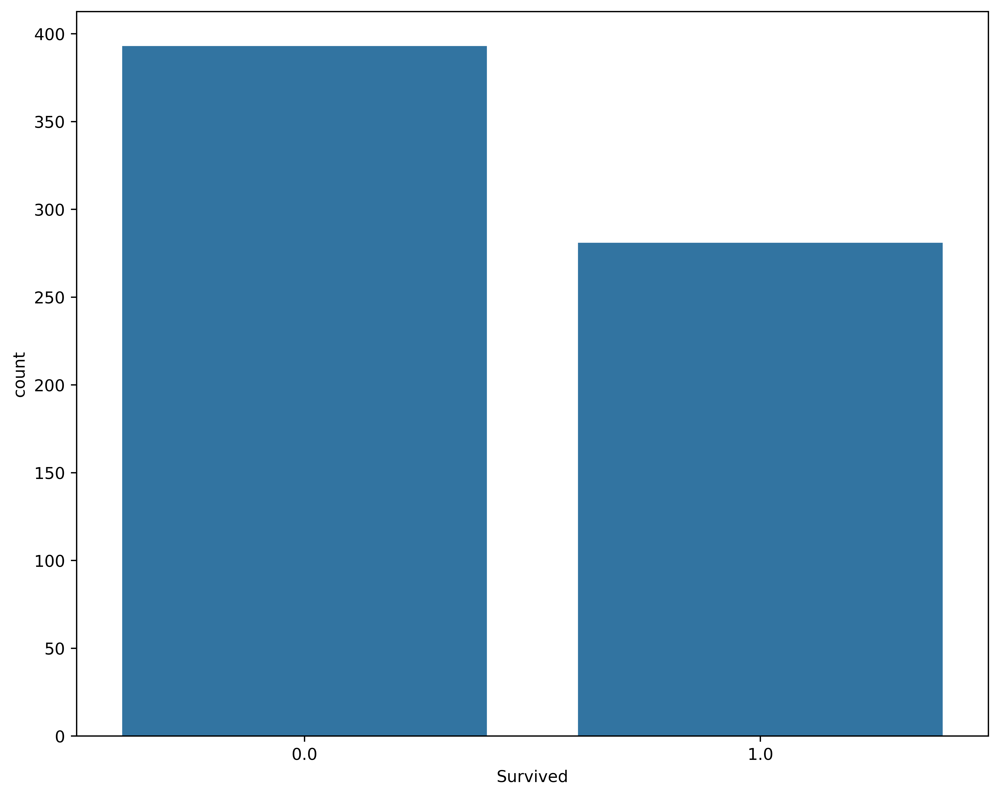

In [28]:
sns.countplot(x=df['Survived'])

In [29]:
x=df.iloc[:,1:]
x

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,2.0,1.0,28.0,1.0,0.0,18.0,2.0
1,0.0,0.0,51.0,1.0,0.0,207.0,0.0
2,2.0,0.0,34.0,0.0,0.0,41.0,2.0
3,0.0,0.0,47.0,1.0,0.0,189.0,2.0
4,2.0,1.0,47.0,0.0,0.0,43.0,2.0
...,...,...,...,...,...,...,...
883,1.0,1.0,36.0,0.0,0.0,72.0,2.0
885,2.0,0.0,52.0,0.0,5.0,151.0,1.0
887,0.0,0.0,24.0,0.0,0.0,153.0,2.0
889,0.0,1.0,34.0,0.0,0.0,153.0,0.0


In [77]:
x2=df.iloc[:,0:]
x2

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0.0,2.0,1.0,28.0,1.0,0.0,18.0,2.0
1,1.0,0.0,0.0,51.0,1.0,0.0,207.0,0.0
2,1.0,2.0,0.0,34.0,0.0,0.0,41.0,2.0
3,1.0,0.0,0.0,47.0,1.0,0.0,189.0,2.0
4,0.0,2.0,1.0,47.0,0.0,0.0,43.0,2.0
...,...,...,...,...,...,...,...,...
883,0.0,1.0,1.0,36.0,0.0,0.0,72.0,2.0
885,0.0,2.0,0.0,52.0,0.0,5.0,151.0,1.0
887,1.0,0.0,0.0,24.0,0.0,0.0,153.0,2.0
889,1.0,0.0,1.0,34.0,0.0,0.0,153.0,0.0


In [30]:
y=df['Survived']
y

0      0.0
1      1.0
2      1.0
3      1.0
4      0.0
      ... 
883    0.0
885    0.0
887    1.0
889    1.0
890    0.0
Name: Survived, Length: 674, dtype: float64

In [31]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=1)


In [32]:
# Model Building

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

In [34]:
# User define function for model building

In [35]:
def prediction(model):
  model.fit(x_train,y_train)
  y_pred=model.predict(x_test)
  print('Training Accuracy:',model.score(x_train,y_train))
  print('Testing Accuracy:',model.score(x_test,y_test))
  print("confusion matrix:",classification_report(y_test,y_pred))

In [36]:
prediction(DecisionTreeClassifier())

Training Accuracy: 0.9851576994434137
Testing Accuracy: 0.6962962962962963
confusion matrix:               precision    recall  f1-score   support

         0.0       0.77      0.74      0.75        85
         1.0       0.58      0.62      0.60        50

    accuracy                           0.70       135
   macro avg       0.68      0.68      0.68       135
weighted avg       0.70      0.70      0.70       135



In [37]:
# Light gradient boost calssifier

In [38]:
prediction(GradientBoostingClassifier())

Training Accuracy: 0.9128014842300557
Testing Accuracy: 0.7777777777777778
confusion matrix:               precision    recall  f1-score   support

         0.0       0.81      0.85      0.83        85
         1.0       0.72      0.66      0.69        50

    accuracy                           0.78       135
   macro avg       0.76      0.75      0.76       135
weighted avg       0.78      0.78      0.78       135



In [39]:
# single model gives high training accuracy and low testing accuracy

In [40]:
# Hyperparameter Tunning for Light Gradient Boost Classifier

In [41]:
params={
    'n_estimators':[90,100,150,180],
    'learning_rate':[0.2,0.4,0.6,0.9],
    'max_depth':[3,4,5,6,10]
}

In [42]:
grid=GridSearchCV(GradientBoostingClassifier(),param_grid=params,verbose=1)
grid.fit(x_train,y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


GridSearchCV(estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.9],
                         'max_depth': [3, 4, 5, 6, 10],
                         'n_estimators': [90, 100, 150, 180]},
             verbose=1)

In [43]:
grid.best_params_

{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}

In [44]:
prediction(GradientBoostingClassifier(learning_rate=0.2,max_depth=3,n_estimators=100))

Training Accuracy: 0.9461966604823747
Testing Accuracy: 0.8
confusion matrix:               precision    recall  f1-score   support

         0.0       0.83      0.86      0.84        85
         1.0       0.74      0.70      0.72        50

    accuracy                           0.80       135
   macro avg       0.79      0.78      0.78       135
weighted avg       0.80      0.80      0.80       135



In [45]:
# XGBM

In [46]:
prediction(XGBClassifier())

Training Accuracy: 0.9814471243042672
Testing Accuracy: 0.762962962962963
confusion matrix:               precision    recall  f1-score   support

         0.0       0.81      0.81      0.81        85
         1.0       0.68      0.68      0.68        50

    accuracy                           0.76       135
   macro avg       0.75      0.75      0.75       135
weighted avg       0.76      0.76      0.76       135



In [47]:
# Hyperparameter tunning fro XGBM

In [48]:
params={'n_estimators':[90,100,150,180],
        'learning_rate':[0.2,0.4,0.6,0.9],
        'max_depth':[3,4,5,6,10],
        'lambda':[1,3,2]}

In [49]:
grid=GridSearchCV(XGBClassifier(),param_grid=params,verbose=1)
grid.fit(x_train,y_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'lambda': [1, 3, 2],
                         'learning_rate': [0.2, 0.4, 0.6, 0.9],
                         'max_depth': [3, 4, 5, 6, 10],
                         'n_estimators': [90, 100, 150, 180]},
             verbose=1)

In [50]:
grid.best_params_

{'lambda': 1, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150}

In [51]:
prediction(XGBClassifier(n_estimators=150,max_depth=3,learning_rate=0.2))

Training Accuracy: 0.9387755102040817
Testing Accuracy: 0.7851851851851852
confusion matrix:               precision    recall  f1-score   support

         0.0       0.81      0.86      0.83        85
         1.0       0.73      0.66      0.69        50

    accuracy                           0.79       135
   macro avg       0.77      0.76      0.76       135
weighted avg       0.78      0.79      0.78       135

